# IMPORTS

In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import missingno as mg

In [103]:
df = pd.read_json('data.json')


In [104]:
display(df)

,ID,Genero,Casado,Edad,Graduado,Profesion,Experiencia_laboral,Gastoscore,Family_Size,anno_nacimiento,Generacion,Ingresos_anuales_brutos,Provincia,Digital_encuesta,Gasto_medio_mensual_cuota,Abandono,Dias_cliente,Campanna_anno
0,CLI10,F,Si,67,Si,Ingeniero,+20annos,Bajo,3,1957,Generacion X,93442,Segovia,1385,80,1,195,NaN
1,CLI100,M,Si,64,Si,Medico,+20annos,Medio,2,1960,Generacion X,99774,Alicante,1052,50,1,360,5.0
2,CLI1000,M,Si,65,Si,Artista,+20annos,Medio,3,1959,Generacion X,36756,Toledo,1717,30,0,407,3.0
3,CLI10000,M,No,33,No,Funcionario,10-20annos,Bajo,4,1991,Millennials,24616,Leon,1606,30,0,544,4.0
4,CLI10001,M,Si,52,No,Otros,+20annos,Medio,2,1972,Generacion X,29834,LLeida,1346,30,1,170,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10801,CLI9995,F,Si,76,No,Servicios,+20annos,Alto,2,1948,Generacion X,33389,Toledo,1424,30,1,106,NaN
10802,CLI9996,F,No,44,Si,Funcionario,+20annos,Bajo,1,1980,Generacion X,76067,Cordoba,1514,50,0,257,NaN
10803,CLI9997,M,Si,47,Si,Ejecutivo,+20annos,Alto,3,1977,Generacion X,61300,Lugo,1385,80,1,347,5.0
10804,CLI9998,M,Si,40,Si,Artista,10-20annos,Alto,3,1984,Millennials,106015,Cuenca,1974,30,0,582,1.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10806 entries, 0 to 10805
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID                         10806 non-null  object 
 1   Genero                     10806 non-null  object 
 2   Casado                     10616 non-null  object 
 3   Edad                       10806 non-null  int64  
 4   Graduado                   10703 non-null  object 
 5   Profesion                  10806 non-null  object 
 6   Experiencia_laboral        10806 non-null  object 
 7   Gastoscore                 10806 non-null  object 
 8   Family_Size                10806 non-null  int64  
 9   anno_nacimiento            10806 non-null  int64  
 10  Generacion                 10806 non-null  object 
 11  Ingresos_anuales_brutos    10806 non-null  int64  
 12  Provincia                  10806 non-null  object 
 13  Digital_encuesta           10806 non-null  int

<Axes: >

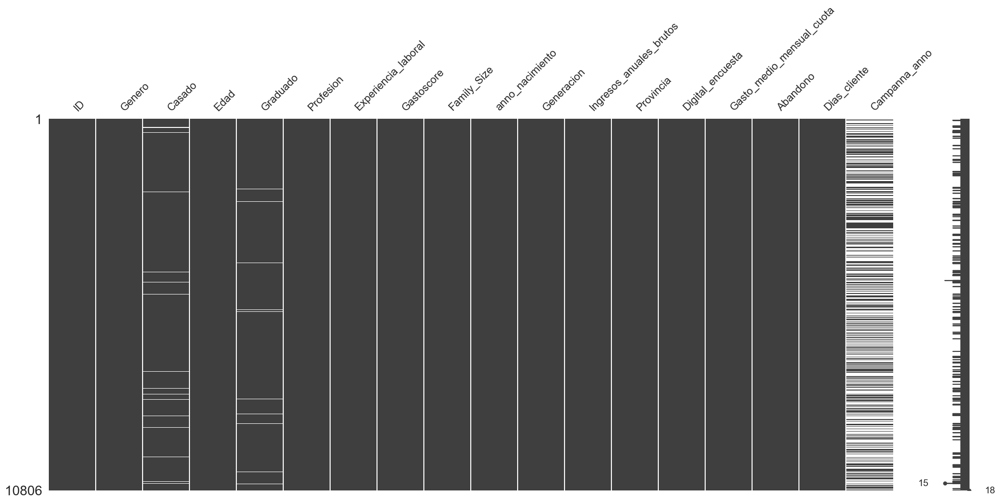

In [105]:
df.info()
df.describe()
# Check for missing values with missingno
mg.matrix(df)


# ONE_HOT

In [106]:
# 1. Convertir variables binarias
binary_map = {'Si': 1, 'No': 0}
gender_map = {'F': 1, 'M': 0}  # Ejemplo: F=1, M=0

df['Genero'] = df['Genero'].map(gender_map)
df['Casado'] = df['Casado'].fillna('No').map(binary_map)
df['Graduado'] = df['Graduado'].fillna('No').map(binary_map)
df['Abandono'] = df['Abandono'].astype(int)

# 2. Convertir variable ordinal "Gastoscore"
gastoscore_map = {'Bajo': 0, 'Medio': 1, 'Alto': 2}
df['Gastoscore'] = df['Gastoscore'].map(gastoscore_map)

# 3. Convertir variable ordinal "Experiencia_laboral"
exp_map = {'<10annos': 0, '10-20annos': 1, '+20annos': 2}
df['Experiencia_laboral'] = df['Experiencia_laboral'].map(exp_map)

# 4. Convertir "Campanna_anno": rellenar NaN, redondear y convertir a entero.
df['Campanna_anno'] = df['Campanna_anno'].fillna(0)
df['Campanna_anno'] = df['Campanna_anno'].astype(float).round().astype(int)

# 5. Aplicar one-hot encoding a las variables categóricas: "Profesion", "Generacion" y "Provincia"
categorical_cols = ['Profesion', 'Generacion', 'Provincia']
for col in categorical_cols:
    if col in df.columns:
        dummies = pd.get_dummies(df[col], prefix=col, drop_first=True)
        df = pd.concat([df, dummies], axis=1)
        df.drop(columns=col, inplace=True)

# 6. Convertir las demás columnas que deben ser numéricas a formato numérico.
numeric_cols = [
    "Edad", "Family_Size", "anno_nacimiento", 
    "Ingresos_anuales_brutos", "Digital_encuesta",
    "Gasto_medio_mensual_cuota", "Dias_cliente"
]
for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# 7. Finalmente, si alguna columna quedó en formato booleano, la convertimos a entero.
for col in df.columns:
    if df[col].dtype == bool:
        df[col] = df[col].astype(int)

# Verificar que todas las columnas son numéricas
print(df.head())
print(df.dtypes)

         ID  Genero  Casado  Edad  Graduado  Experiencia_laboral  Gastoscore  \
0     CLI10       1       1    67         1                    2           0   
1    CLI100       0       1    64         1                    2           1   
2   CLI1000       0       1    65         1                    2           1   
3  CLI10000       0       0    33         0                    1           0   
4  CLI10001       0       1    52         0                    2           1   

   Family_Size  anno_nacimiento  Ingresos_anuales_brutos  ...  \
0            3             1957                    93442  ...   
1            2             1960                    99774  ...   
2            3             1959                    36756  ...   
3            4             1991                    24616  ...   
4            2             1972                    29834  ...   

   Provincia_Tarragona  Provincia_Teruel  Provincia_Toledo  \
0                    0                 0                 0   
1   

PC1: 7.81%
PC2: 2.50%


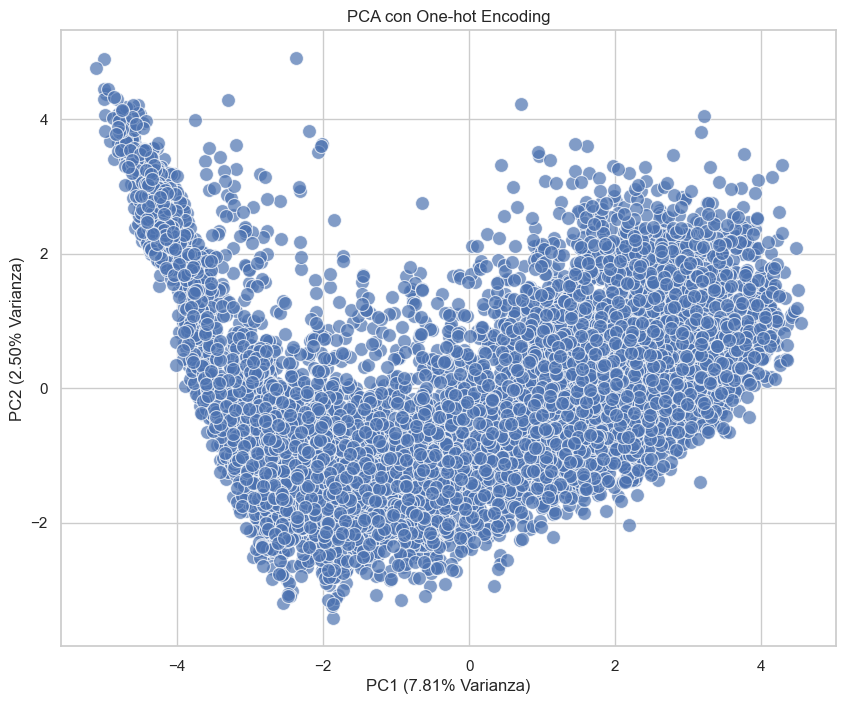

/Users/frankllonch/.local/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129 (\x81) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


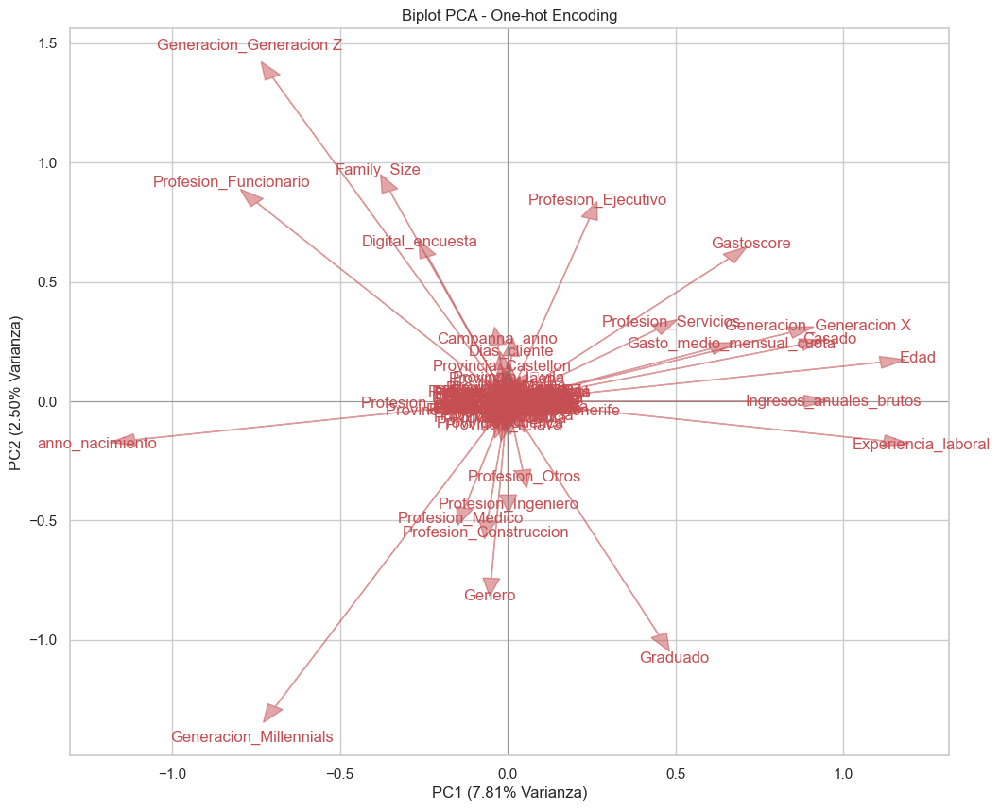

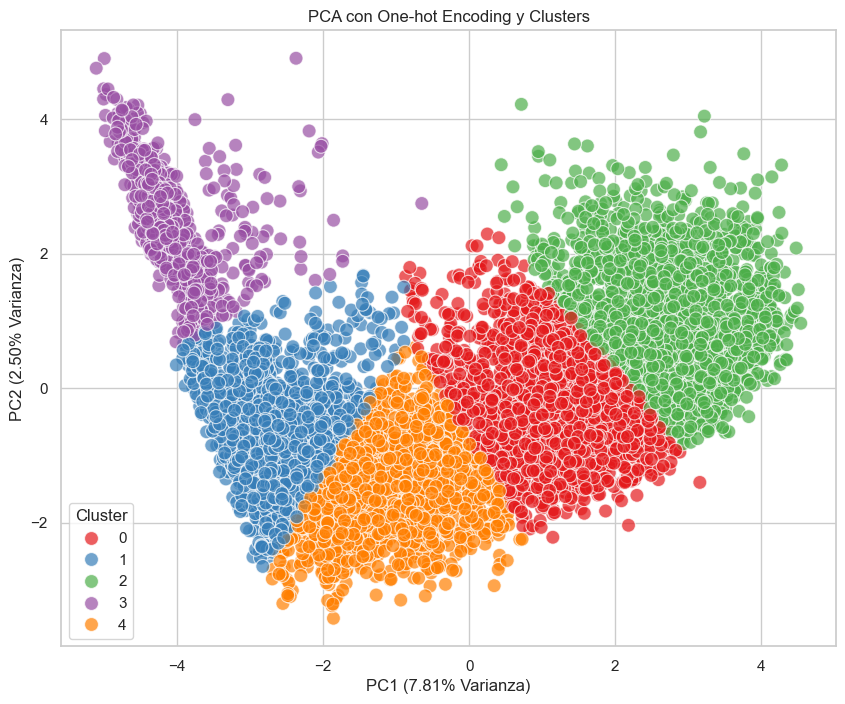

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


# 5. Convertir otras columnas a numérico
numeric_cols = ['Edad', 'Family_Size', 'anno_nacimiento', 
                'Ingresos_anuales_brutos', 'Digital_encuesta', 
                'Gasto_medio_mensual_cuota', 'Dias_cliente']
for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# 6. Eliminar la columna ID si no se requiere para el análisis
if 'ID' in df.columns:
    df.drop(columns=['ID'], inplace=True)

# 7. Imputar valores faltantes en el DataFrame final (todas las columnas son numéricas)
imputer = SimpleImputer(strategy='median')
X = imputer.fit_transform(df)

# 8. Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 9. Aplicar PCA
n_components = 2  # Puedes ajustar este número
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i}' for i in range(1, n_components+1)])

# Mostrar varianza explicada
varianza_explicada = pca.explained_variance_ratio_
for i, var in enumerate(varianza_explicada, start=1):
    print(f"PC{i}: {var*100:.2f}%")

# 10. Visualización: Scatter Plot
plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, s=100, alpha=0.7)
plt.title('PCA con One-hot Encoding')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.show()

# 11. Biplot: Visualizar vectores de variables originales.
continuous_cols = df.columns.tolist()  # Todas las columnas usadas
cargas = pca.components_.T
escalamiento = 3  # Ajusta este factor según convenga
cargas_scaled = cargas * escalamiento

plt.figure(figsize=(12,10))
for i, var in enumerate(continuous_cols):
    plt.arrow(0, 0, cargas_scaled[i,0], cargas_scaled[i,1], 
              color='r', alpha=0.5, head_width=0.05)
    plt.text(cargas_scaled[i,0]*1.1, cargas_scaled[i,1]*1.1, var, 
             color='r', ha='center', va='center')
plt.title('Biplot PCA - One-hot Encoding')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.axhline(0, color='grey', linewidth=0.5)
plt.axvline(0, color='grey', linewidth=0.5)
plt.show()

# 12. Clustering con K-Means sobre las componentes principales
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(pca_df[['PC1', 'PC2']])
pca_df['Cluster'] = clusters

plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100, alpha=0.7)
plt.title('PCA con One-hot Encoding y Clusters')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.show()

#  LABEL ENCODING

In [108]:
df1 = pd.read_json('data.json')
# Supongamos que ya tienes el DataFrame cargado en df
# Ejemplo: df = pd.read_csv('df(2).csv')

# 1. Convertir variables binarias
binary_map = {'Si': 1, 'No': 0}
gender_map = {'F': 1, 'M': 0}  # Por ejemplo, F=1, M=0

df1['Genero'] = df1['Genero'].map(gender_map)
df1['Casado'] = df1['Casado'].fillna('No').map(binary_map)
df1['Graduado'] = df1['Graduado'].fillna('No').map(binary_map)
df1['Abandono'] = df1['Abandono'].astype(int)

# 2. Convertir variable ordinal "Gastoscore"
gastoscore_map = {'Bajo': 0, 'Medio': 1, 'Alto': 2}
df1['Gastoscore'] = df1['Gastoscore'].map(gastoscore_map)

# 3. Convertir variable ordinal "Experiencia_laboral"
exp_map = {'<10annos': 0, '10-20annos': 1, '+20annos': 2}
df1['Experiencia_laboral'] = df1['Experiencia_laboral'].map(exp_map)

# 4. Procesar "Campanna_anno": rellenar NaN, redondear y convertir a entero.
df1['Campanna_anno'] = df1['Campanna_anno'].fillna(0)
df1['Campanna_anno'] = df1['Campanna_anno'].astype(float).round().astype(int)

# 5. Codificación por etiqueta (label encoding) para "Profesion", "Generacion" y "Provincia"
# Se asigna un entero a cada categoría de forma arbitraria.
for col in ['Profesion', 'Generacion', 'Provincia']:
    if col in df1.columns:
        df1[col] = pd.factorize(df1[col])[0]

# 6. Asegurarse de que las columnas numéricas están en formato numérico
numeric_cols = [
    "Edad", "Family_Size", "anno_nacimiento", 
    "Ingresos_anuales_brutos", "Digital_encuesta",
    "Gasto_medio_mensual_cuota", "Dias_cliente"
]
for col in numeric_cols:
    if col in df1.columns:
        df1[col] = pd.to_numeric(df1[col], errors='coerce')

# 7. Si alguna columna quedó en formato booleano, convertirla a entero.
for col in df1.columns:
    if df1[col].dtype == bool:
        df1[col] = df1[col].astype(int)

# Opcional: eliminar la columna "ID" si no se requiere para el clustering
if 'ID' in df1.columns:
    df1.drop(columns=['ID'], inplace=True)

# Verificar resultados
print(df1.head())
print(df1.dtypes)

   Genero  Casado  Edad  Graduado  Profesion  Experiencia_laboral  Gastoscore  \
0       1       1    67         1          0                    2           0   
1       0       1    64         1          1                    2           1   
2       0       1    65         1          2                    2           1   
3       0       0    33         0          3                    1           0   
4       0       1    52         0          4                    2           1   

   Family_Size  anno_nacimiento  Generacion  Ingresos_anuales_brutos  \
0            3             1957           0                    93442   
1            2             1960           0                    99774   
2            3             1959           0                    36756   
3            4             1991           1                    24616   
4            2             1972           0                    29834   

   Provincia  Digital_encuesta  Gasto_medio_mensual_cuota  Abandono  \
0        

PC1: 27.32%
PC2: 10.27%


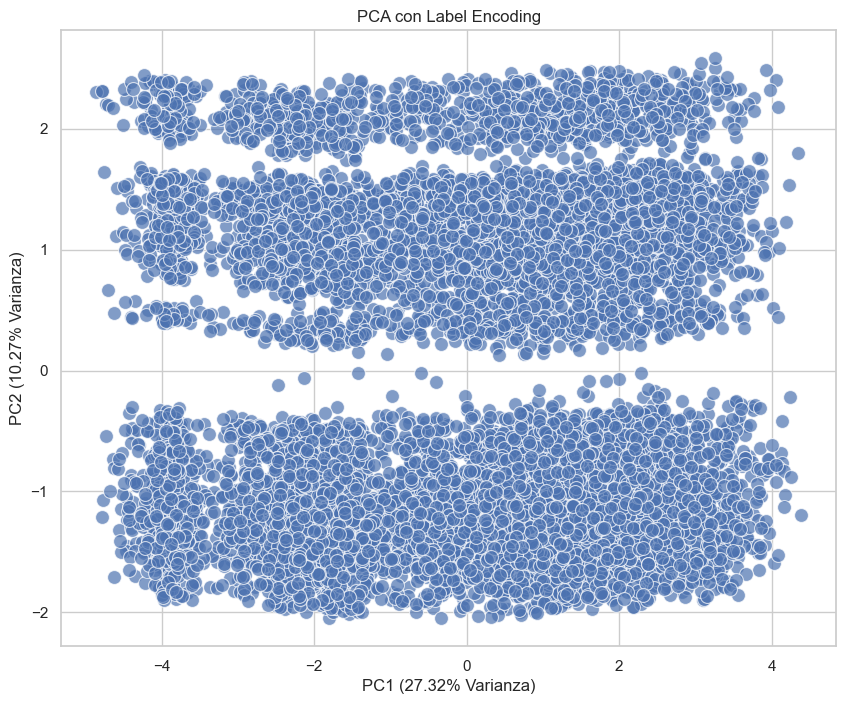

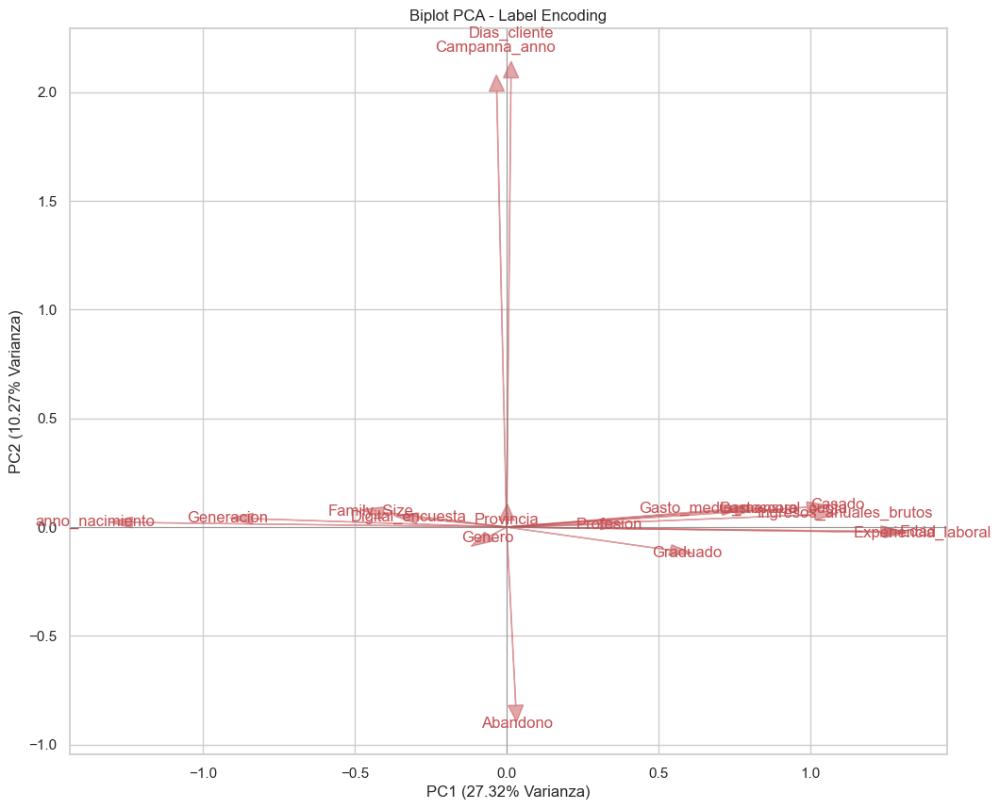


Cargas de las variables (Label Encoding):
                                PC1       PC2
Genero                    -0.019063 -0.014397
Casado                     0.330044  0.030453
Edad                       0.410652 -0.006631
Graduado                   0.179576 -0.035359
Profesion                  0.102781  0.004124
Experiencia_laboral        0.414589 -0.007973
Gastoscore                 0.250806  0.025903
Family_Size               -0.135318  0.022590
anno_nacimiento           -0.410751  0.007054
Generacion                -0.278734  0.012852
Ingresos_anuales_brutos    0.338046  0.019071
Provincia                  0.000208  0.010431
Digital_encuesta          -0.097754  0.013541
Gasto_medio_mensual_cuota  0.235967  0.026416
Abandono                   0.010027 -0.273091
Dias_cliente               0.004800  0.688529
Campanna_anno             -0.010865  0.667900


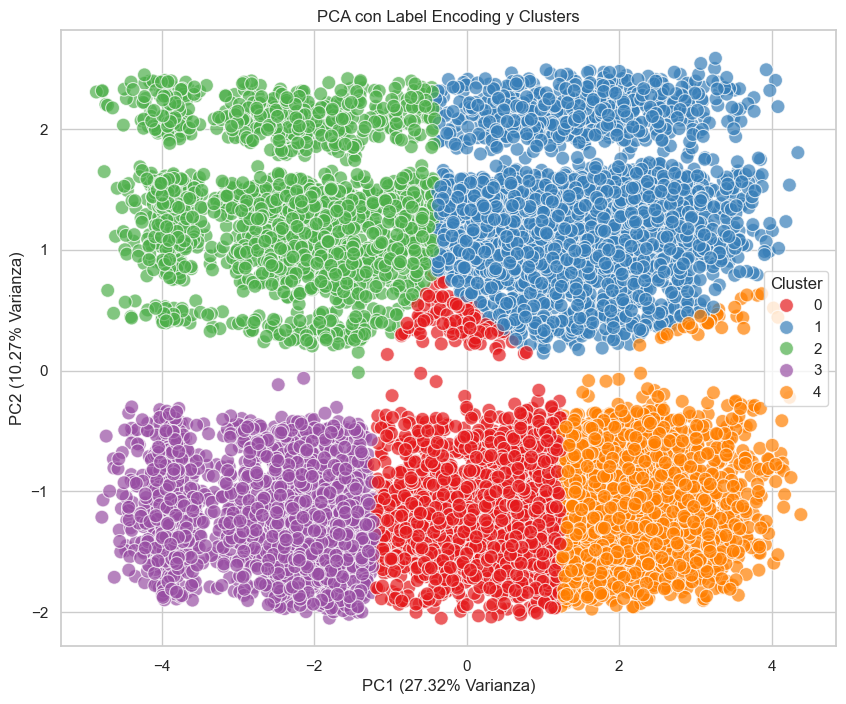

In [109]:

# 3. Procesar Campanna_anno: rellenar NaN, redondear y convertir a entero.
df1['Campanna_anno'] = df1['Campanna_anno'].fillna(0)
df1['Campanna_anno'] = df1['Campanna_anno'].astype(float).round().astype(int)



# 5. Convertir otras columnas a numérico
numeric_cols = ['Edad', 'Family_Size', 'anno_nacimiento', 
                'Ingresos_anuales_brutos', 'Digital_encuesta', 
                'Gasto_medio_mensual_cuota', 'Dias_cliente']
for col in numeric_cols:
    if col in df1.columns:
        df1[col] = pd.to_numeric(df1[col], errors='coerce')

# 6. Eliminar la columna ID si no se requiere
if 'ID' in df1.columns:
    df1.drop(columns=['ID'], inplace=True)

# 7. Imputar valores faltantes en el DataFrame final
imputer = SimpleImputer(strategy='median')
X = imputer.fit_transform(df1)

# 8. Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 9. Aplicar PCA
n_components = 2
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i}' for i in range(1, n_components+1)])

# Mostrar varianza explicada
varianza_explicada = pca.explained_variance_ratio_
for i, var in enumerate(varianza_explicada, start=1):
    print(f"PC{i}: {var*100:.2f}%")

# 10. Scatter plot del PCA
plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, s=100, alpha=0.7)
plt.title('PCA con Label Encoding')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.show()

# 11. Biplot: Visualizar vectores de variables originales
continuous_cols = df1.columns.tolist()
cargas = pca.components_.T
escalamiento = 3
cargas_scaled = cargas * escalamiento

plt.figure(figsize=(12,10))
for i, var in enumerate(continuous_cols):
    plt.arrow(0, 0, cargas_scaled[i,0], cargas_scaled[i,1], 
              color='r', alpha=0.5, head_width=0.05)
    plt.text(cargas_scaled[i,0]*1.1, cargas_scaled[i,1]*1.1, var, 
             color='r', ha='center', va='center')
plt.title('Biplot PCA - Label Encoding')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.axhline(0, color='grey', linewidth=0.5)
plt.axvline(0, color='grey', linewidth=0.5)
plt.show()

# 12. Mostrar cargas en un DataFrame
cargas_df = pd.DataFrame(cargas, index=continuous_cols, columns=['PC1', 'PC2'])
print("\nCargas de las variables (Label Encoding):")
print(cargas_df)

# 13. Clustering con K-Means sobre PCA
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(pca_df[['PC1', 'PC2']])
pca_df['Cluster'] = clusters

plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100, alpha=0.7)
plt.title('PCA con Label Encoding y Clusters')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Varianza)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Varianza)')
plt.grid(True)
plt.show()

# BInary ONEHOT


Continuous variables selected for PCA: ['Edad', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Ingresos_anuales_brutos', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Dias_cliente', 'Campanna_anno']
Binary variables detected: ['Genero', 'Casado', 'Graduado', 'Abandono', 'Profesion_Construccion', 'Profesion_Ejecutivo', 'Profesion_Funcionario', 'Profesion_Ingeniero', 'Profesion_Medico', 'Profesion_Negocios/empresa', 'Profesion_Otros', 'Profesion_Servicios', 'Generacion_Generacion X', 'Generacion_Generacion Z', 'Generacion_Millennials', 'Provincia_Alicante', 'Provincia_Almeri\xada', 'Provincia_Badajoz', 'Provincia_Baleares', 'Provincia_Barcelona', 'Provincia_Burgos', 'Provincia_Caceres', 'Provincia_Cadiz', 'Provincia_Castellon', 'Provincia_Ceuta', 'Provincia_Ciudad Real', 'Provincia_Cordoba', 'Provincia_Cuenca', 'Provincia_Gerona', 'Provincia_Granada', 'Provincia_Guadalajara', 'Provincia_Guipiºzcoa', 'Provincia_Huelva', 'Provincia_Huesca', 'Provincia_Jaen', '

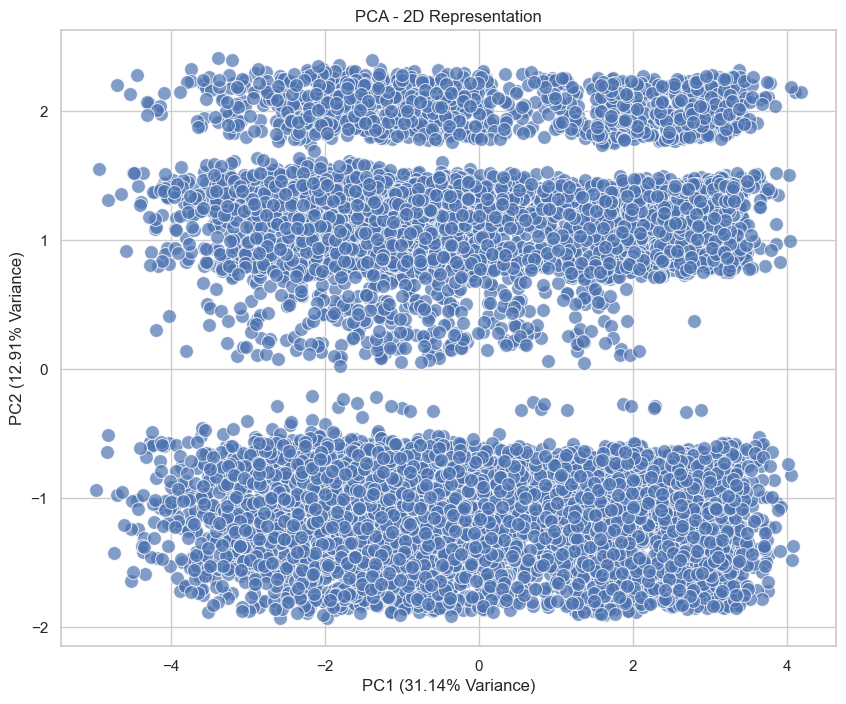

/Users/frankllonch/.local/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129 (\x81) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


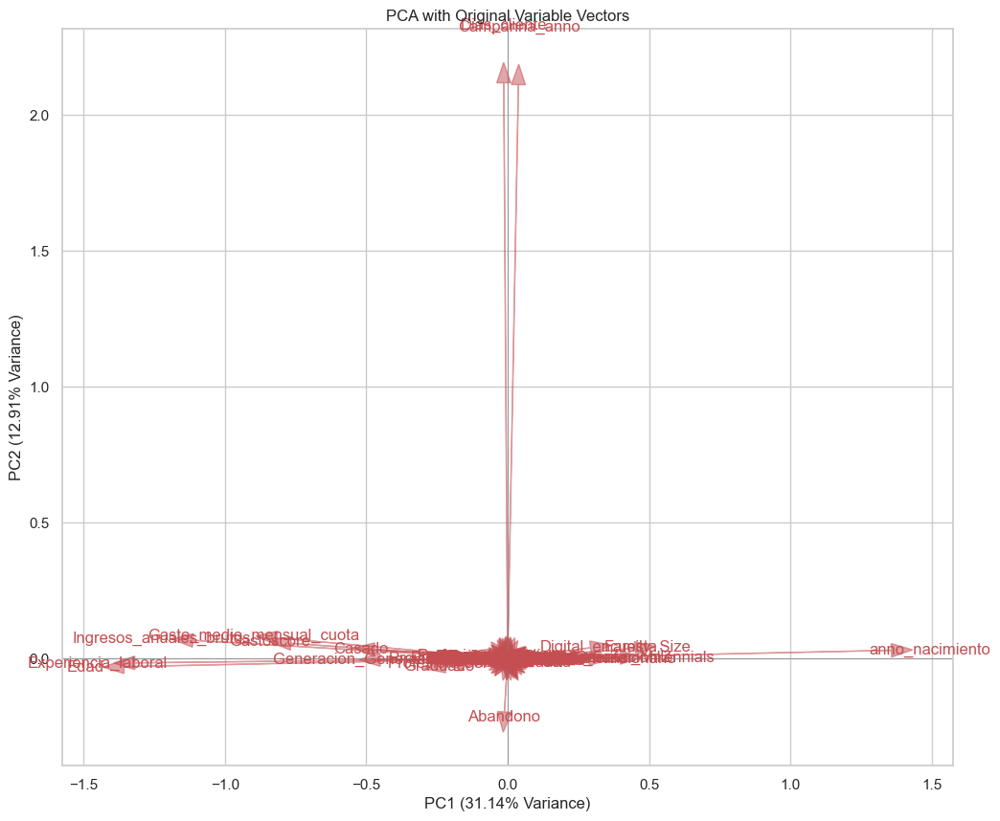

/Users/frankllonch/.local/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 129 (\x81) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)



Variable loadings on principal components:
                          PC1       PC2
Edad                -0.452188 -0.009832
Experiencia_laboral -0.439311 -0.005152
Gastoscore          -0.255434  0.018819
Family_Size          0.150125  0.012680
anno_nacimiento      0.452224  0.010253
...                       ...       ...
Provincia_Vizcaya   -0.001156 -0.000742
Provincia_Zamora    -0.000009 -0.000652
Provincia_Zaragoza  -0.000776  0.002141
Provincia_ilava     0.000527 -0.000262
Provincia_ivila    -0.000142  0.001232

[74 rows x 2 columns]


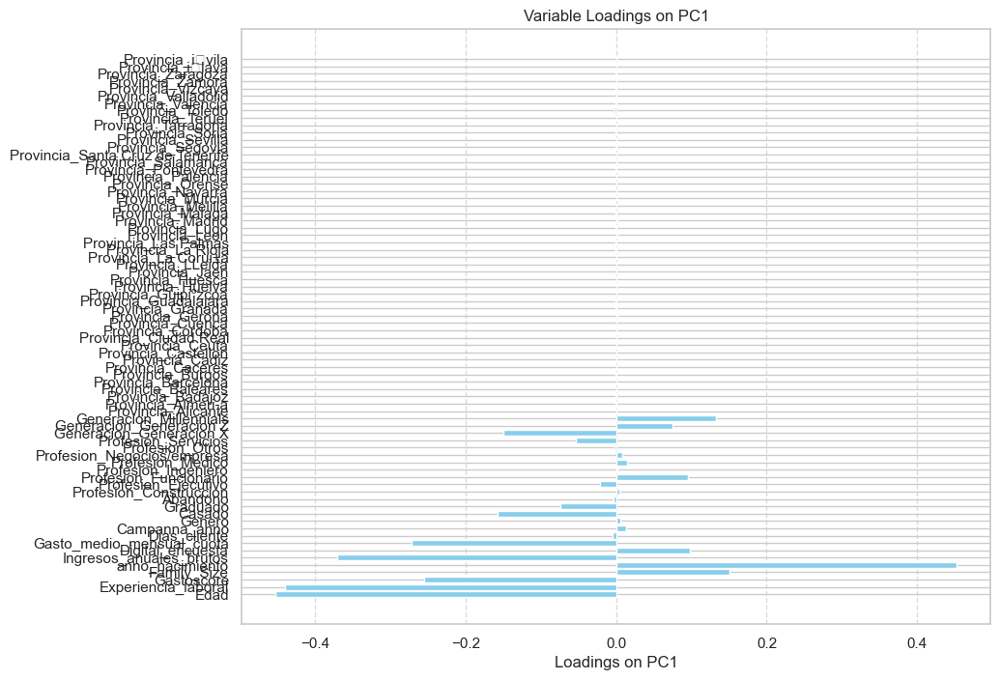

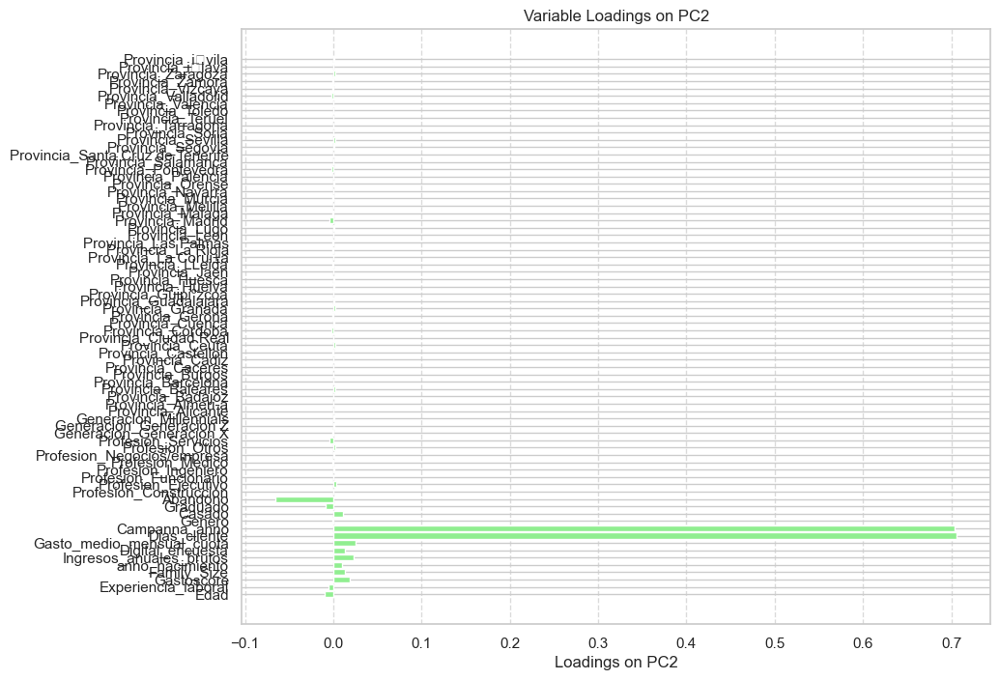

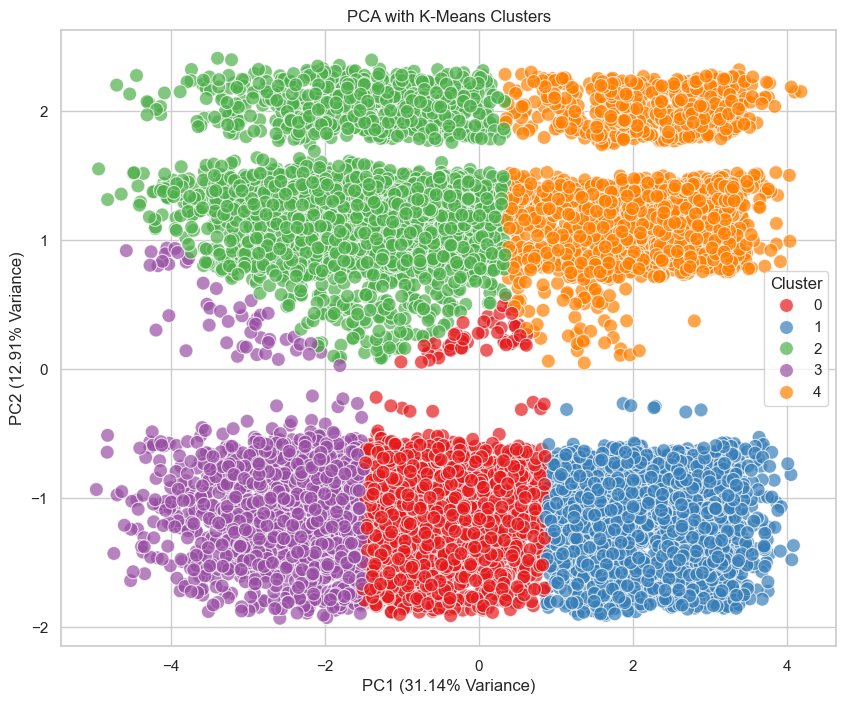

In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Set visualization style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Assume your DataFrame "df" is already loaded.
# For example: df = pd.read_csv("your_file.csv")

# Select numeric columns (only those already in numeric format)
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Identify binary and continuous variables among numeric columns
binary_cols = []
continuous_cols = []

for col in numerical_cols:
    unique_values = df[col].dropna().unique()
    if set(unique_values).issubset({0, 1}):
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

# Exclude identifier columns (e.g. "ID")
id_cols = ['ID']
continuous_cols = [col for col in continuous_cols if col not in id_cols]

print(f"\nContinuous variables selected for PCA: {continuous_cols}")
print(f"Binary variables detected: {binary_cols}")

# Prepare continuous data: drop rows with missing values
df_continuous = df[continuous_cols].dropna()

# Standardize continuous variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_continuous)

# For binary variables, convert them to float (without scaling)
df_binary = df[binary_cols].astype(float) if binary_cols else None

# Concatenate scaled continuous data and binary columns
if df_binary is not None:
    # Note: Make sure to align rows if needed. Here we assume no missing values for binary cols.
    X_final = np.hstack((X_scaled, df_binary.values))
    feature_names = continuous_cols + binary_cols
else:
    X_final = X_scaled
    feature_names = continuous_cols

# Apply PCA with 2 components
n_components = 2  # Adjust as needed
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_final)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(n_components)])

# Get explained variance ratio
varianza_explicada = pca.explained_variance_ratio_
for i, var in enumerate(varianza_explicada, start=1):
    print(f"PC{i}: {var*100:.2f}% of explained variance")

# Scatter plot of the first two principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, s=100, alpha=0.7)
plt.title('PCA - 2D Representation')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.show()

# Biplot: plot vectors (loadings) of the original variables
cargas = pca.components_.T
scaling_factor = 3  # Adjust scaling factor as needed
cargas_scaled = cargas * scaling_factor

plt.figure(figsize=(12, 10))
# Make sure we use as many variable names as the number of features in X_final
features_for_plot = feature_names[:cargas_scaled.shape[0]]
for i, var in enumerate(features_for_plot):
    plt.arrow(0, 0, cargas_scaled[i, 0], cargas_scaled[i, 1], 
              color='r', alpha=0.5, head_width=0.05)
    plt.text(cargas_scaled[i, 0]*1.1, cargas_scaled[i, 1]*1.1, 
             var, color='r', ha='center', va='center')

plt.title('PCA with Original Variable Vectors')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.axhline(0, color='grey', linewidth=0.5)
plt.axvline(0, color='grey', linewidth=0.5)
plt.show()

# Create a DataFrame with the loadings
cargas_df = pd.DataFrame(cargas, index=feature_names, columns=['PC1', 'PC2'])
print("\nVariable loadings on principal components:")
print(cargas_df)

# Bar plots for loadings in PC1 and PC2
for pc in ['PC1', 'PC2']:
    plt.figure(figsize=(10, 8))
    plt.barh(cargas_df.index, cargas_df[pc],
             color='skyblue' if pc == 'PC1' else 'lightgreen')
    plt.xlabel(f'Loadings on {pc}')
    plt.title(f'Variable Loadings on {pc}')
    plt.grid(True, axis='x', linestyle='--', alpha=0.7)
    plt.show()

# Clustering with K-Means on the PCA output
num_clusters = 5  # Adjust the number of clusters as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_df[['PC1', 'PC2']])
pca_df['Cluster'] = clusters

# Scatter plot showing clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100, alpha=0.7)
plt.title('PCA with K-Means Clusters')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.show()

# BINARY LABEL ENCODING


Continuous variables selected for PCA: ['Edad', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Dias_cliente', 'Campanna_anno']
Binary variables detected: ['Genero', 'Casado', 'Graduado', 'Abandono']
PC1: 30.11% of explained variance
PC2: 12.12% of explained variance


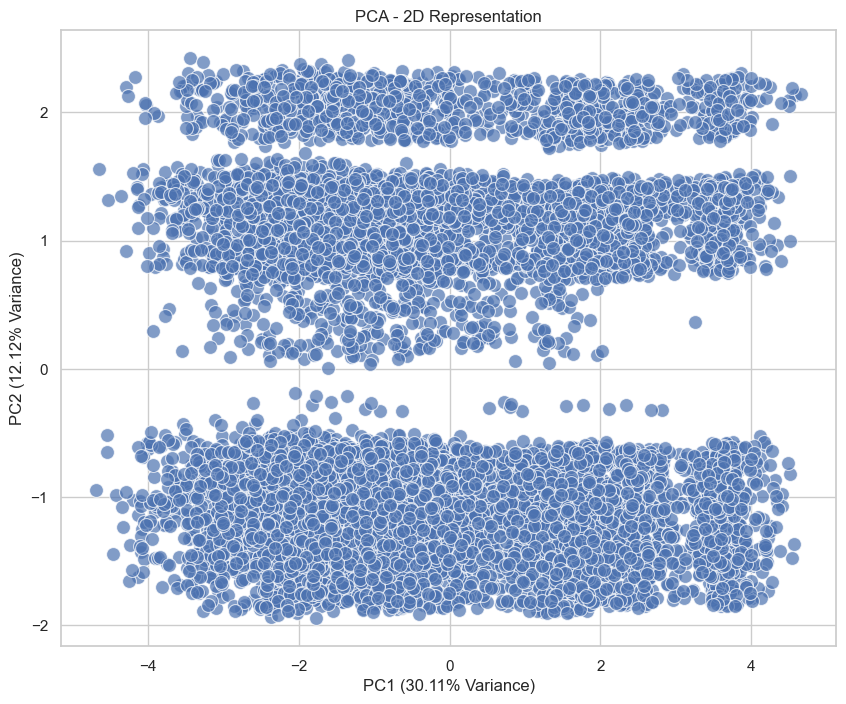

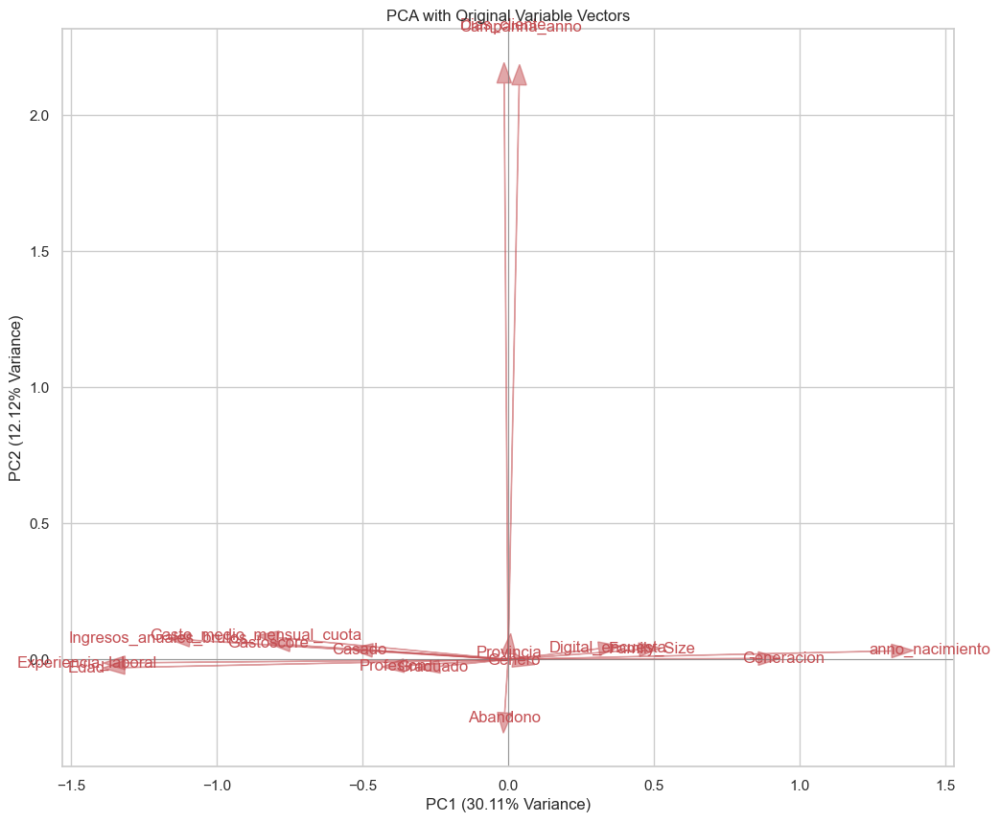


Variable loadings on principal components:
                                PC1       PC2
Edad                      -0.438521 -0.009932
Profesion                 -0.119234 -0.007669
Experiencia_laboral       -0.438089 -0.004211
Gastoscore                -0.249222  0.017883
Family_Size                0.149771  0.011981
anno_nacimiento            0.438576  0.010354
Generacion                 0.286156  0.001125
Ingresos_anuales_brutos   -0.364039  0.023743
Provincia                  0.000635  0.006912
Digital_encuesta           0.103813  0.013196
Gasto_medio_mensual_cuota -0.262813  0.026536
Dias_cliente              -0.004473  0.705929
Campanna_anno              0.012637  0.703537
Genero                     0.006089 -0.001264
Casado                    -0.154967  0.011122
Graduado                  -0.078512 -0.008529
Abandono                  -0.003919 -0.065307


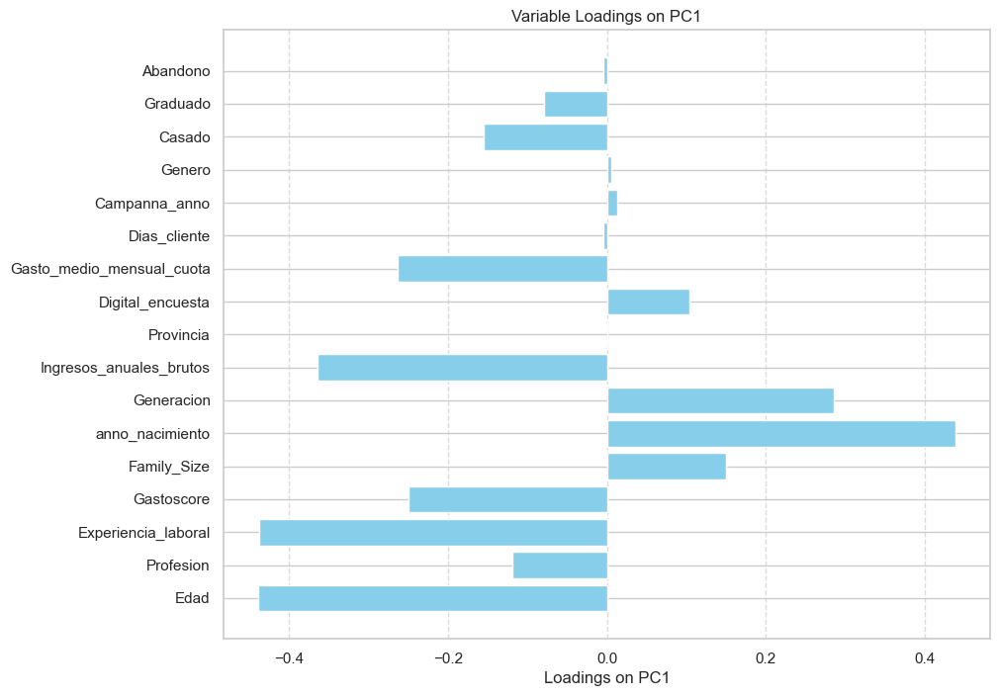

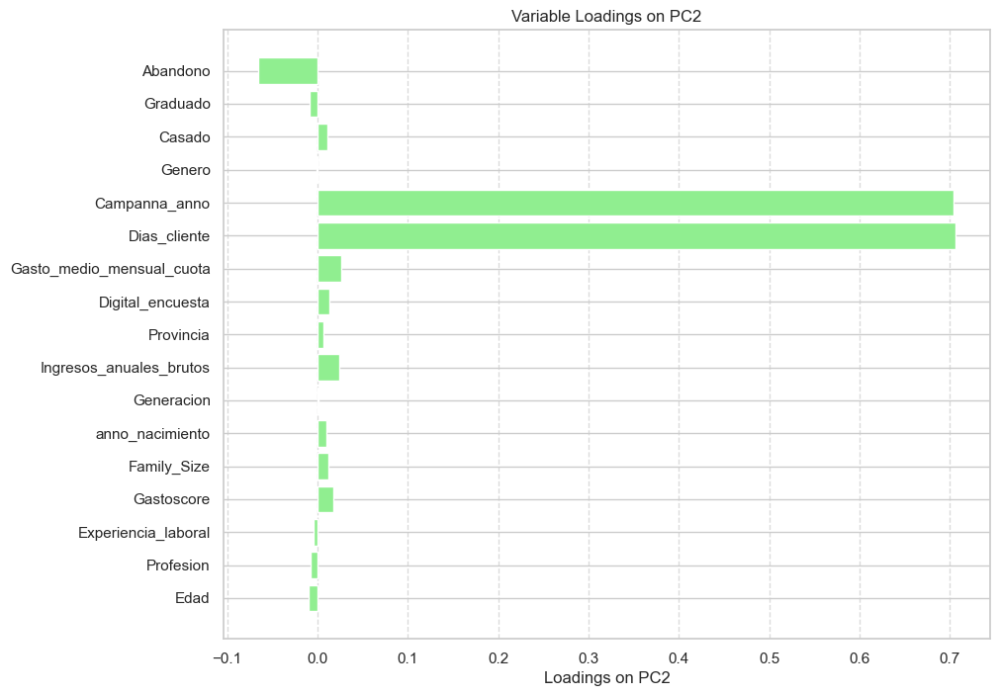

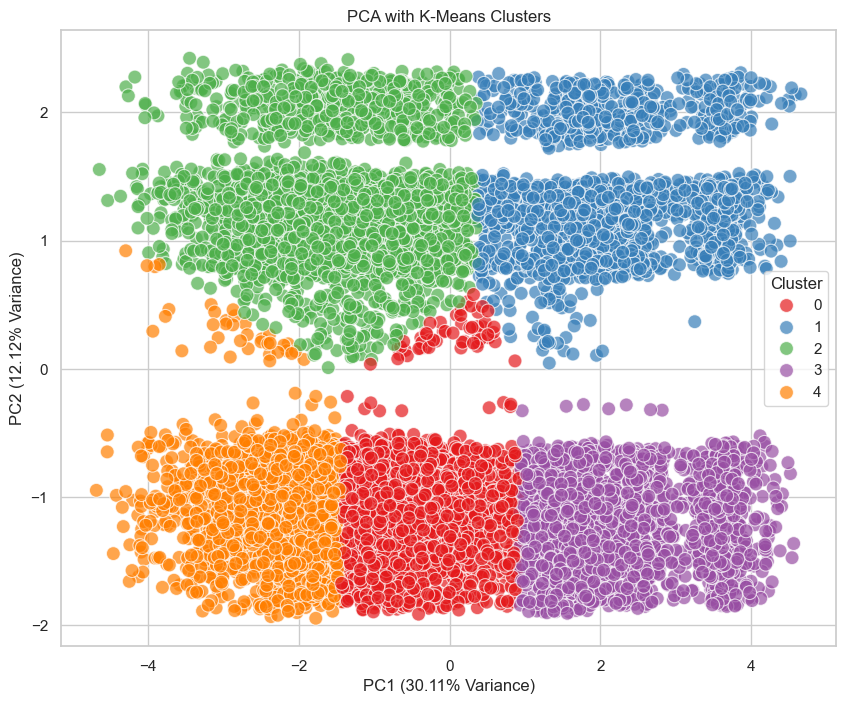

In [111]:

# Set visualization style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Assume your DataFrame "df" is already loaded.
# For example: df = pd.read_csv("your_file.csv")

# Select numeric columns (only those already in numeric format)
numerical_cols = df1.select_dtypes(include=[np.number]).columns.tolist()

# Identify binary and continuous variables among numeric columns
binary_cols = []
continuous_cols = []

for col in numerical_cols:
    unique_values = df1[col].dropna().unique()
    if set(unique_values).issubset({0, 1}):
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

# Exclude identifier columns (e.g. "ID")
id_cols = ['ID']
continuous_cols = [col for col in continuous_cols if col not in id_cols]

print(f"\nContinuous variables selected for PCA: {continuous_cols}")
print(f"Binary variables detected: {binary_cols}")

# Prepare continuous data: drop rows with missing values
df_continuous = df1[continuous_cols].dropna()

# Standardize continuous variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_continuous)

# For binary variables, convert them to float (without scaling)
df_binary = df1[binary_cols].astype(float) if binary_cols else None

# Concatenate scaled continuous data and binary columns
if df_binary is not None:
    # Note: Make sure to align rows if needed. Here we assume no missing values for binary cols.
    X_final = np.hstack((X_scaled, df_binary.values))
    feature_names = continuous_cols + binary_cols
else:
    X_final = X_scaled
    feature_names = continuous_cols

# Apply PCA with 2 components
n_components = 2  # Adjust as needed
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_final)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(n_components)])

# Get explained variance ratio
varianza_explicada = pca.explained_variance_ratio_
for i, var in enumerate(varianza_explicada, start=1):
    print(f"PC{i}: {var*100:.2f}% of explained variance")

# Scatter plot of the first two principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, s=100, alpha=0.7)
plt.title('PCA - 2D Representation')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.show()

# Biplot: plot vectors (loadings) of the original variables
cargas = pca.components_.T
scaling_factor = 3  # Adjust scaling factor as needed
cargas_scaled = cargas * scaling_factor

plt.figure(figsize=(12, 10))
# Make sure we use as many variable names as the number of features in X_final
features_for_plot = feature_names[:cargas_scaled.shape[0]]
for i, var in enumerate(features_for_plot):
    plt.arrow(0, 0, cargas_scaled[i, 0], cargas_scaled[i, 1], 
              color='r', alpha=0.5, head_width=0.05)
    plt.text(cargas_scaled[i, 0]*1.1, cargas_scaled[i, 1]*1.1, 
             var, color='r', ha='center', va='center')

plt.title('PCA with Original Variable Vectors')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.axhline(0, color='grey', linewidth=0.5)
plt.axvline(0, color='grey', linewidth=0.5)
plt.show()

# Create a DataFrame with the loadings
cargas_df = pd.DataFrame(cargas, index=feature_names, columns=['PC1', 'PC2'])
print("\nVariable loadings on principal components:")
print(cargas_df)

# Bar plots for loadings in PC1 and PC2
for pc in ['PC1', 'PC2']:
    plt.figure(figsize=(10, 8))
    plt.barh(cargas_df.index, cargas_df[pc],
             color='skyblue' if pc == 'PC1' else 'lightgreen')
    plt.xlabel(f'Loadings on {pc}')
    plt.title(f'Variable Loadings on {pc}')
    plt.grid(True, axis='x', linestyle='--', alpha=0.7)
    plt.show()

# Clustering with K-Means on the PCA output
num_clusters = 5  # Adjust the number of clusters as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_df[['PC1', 'PC2']])
pca_df['Cluster'] = clusters

# Scatter plot showing clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='Set1', s=100, alpha=0.7)
plt.title('PCA with K-Means Clusters')
plt.xlabel(f'PC1 ({varianza_explicada[0]*100:.2f}% Variance)')
plt.ylabel(f'PC2 ({varianza_explicada[1]*100:.2f}% Variance)')
plt.grid(True)
plt.show()

Dimensions of df1: (10806, 17)

Numeric columns in df1: ['Genero', 'Casado', 'Edad', 'Graduado', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Abandono', 'Dias_cliente', 'Campanna_anno']

Continuous variables selected for t-SNE: ['Edad', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Dias_cliente', 'Campanna_anno']
Binary variables detected: ['Genero', 'Casado', 'Graduado', 'Abandono']

Number of rows after dropping missing values: 10806

Standardized data (first few rows):
       Edad  Profesion  Experiencia_laboral  Gastoscore  Family_Size  \
0  1.035176  -1.439963             0.775758   -0.731429     0.152186   
1  0.872409  -0.993919             0.775758    0.621270    -0.493738   
2  0.926665  -0.547875

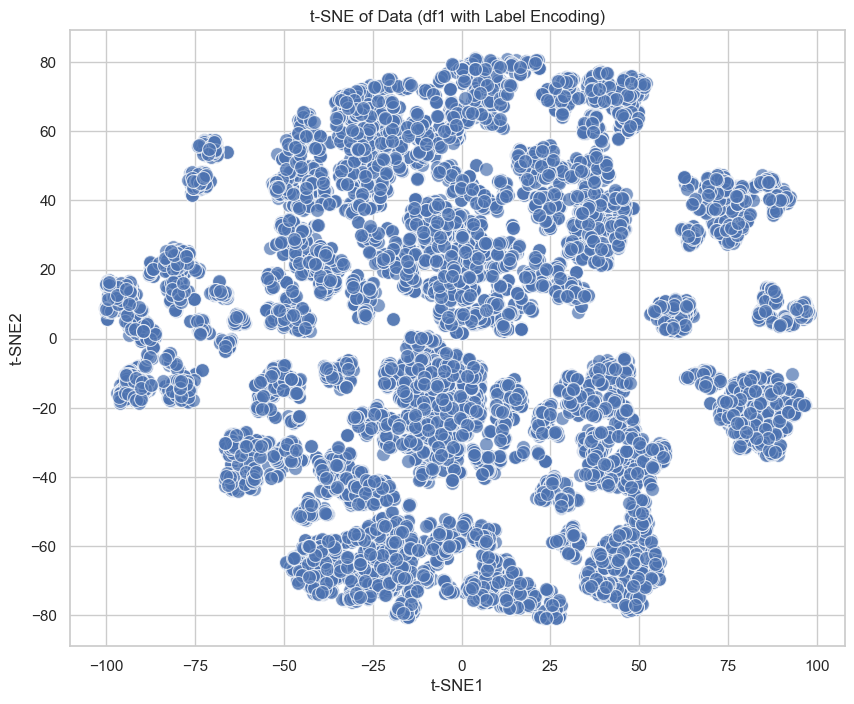

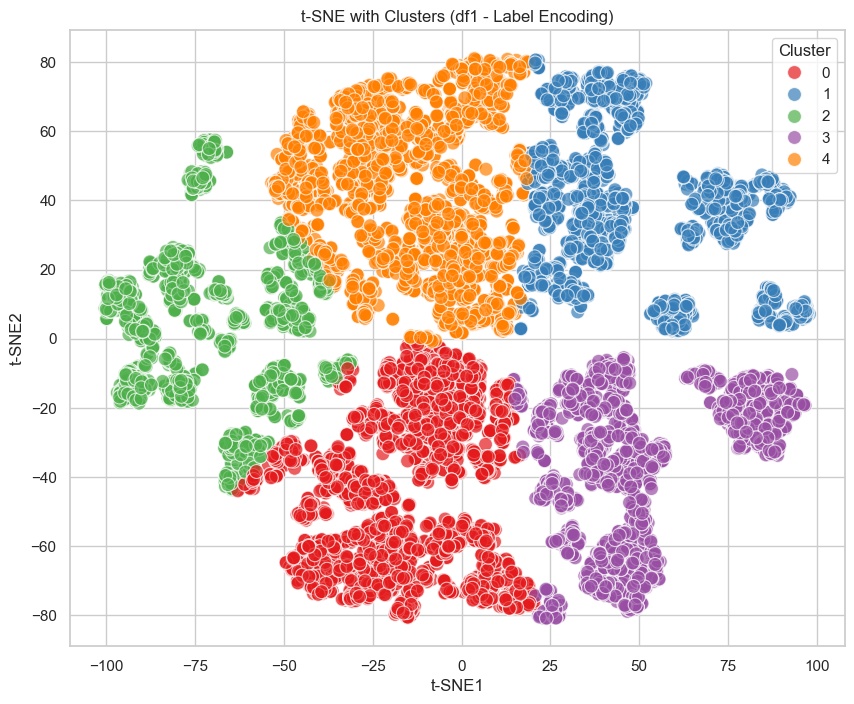

In [112]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Set visualization style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Assume df1 is your label‑encoded DataFrame
print("Dimensions of df1:", df1.shape)

# Select numeric columns from df1
numerical_cols = df1.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in df1:", numerical_cols)

# Identify binary (0/1) and continuous variables among numeric columns
binary_cols = []
continuous_cols = []
for col in numerical_cols:
    unique_values = df1[col].dropna().unique()
    # Check if the sorted unique values exactly equal [0, 1]
    if sorted(unique_values) == [0, 1]:
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

# Exclude 'patient_id' from continuous variables if it exists
if 'patient_id' in continuous_cols:
    continuous_cols.remove('patient_id')
    print("\n'patient_id' excluded from continuous variables.")

print("\nContinuous variables selected for t-SNE:", continuous_cols)
print("Binary variables detected:", binary_cols)

# Select only continuous variables from df1
df_continuous = df1[continuous_cols]

# Handle missing values by dropping rows with NA (you could also impute if needed)
df_cleaned = df_continuous.dropna()
print(f"\nNumber of rows after dropping missing values: {df_cleaned.shape[0]}")

# Standardize the continuous variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cleaned)
df_scaled = pd.DataFrame(X_scaled, columns=continuous_cols)
print("\nStandardized data (first few rows):")
print(df_scaled.head())

# Apply t-SNE to the standardized data
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_components, columns=['t-SNE1', 't-SNE2'])

# (Optional) Get all t-SNE points as a list
tsne_points = tsne_df.values.tolist()

# Visualization: Scatter plot of t-SNE components
plt.figure(figsize=(10, 8))
sns.scatterplot(x='t-SNE1', y='t-SNE2', data=tsne_df, s=100, alpha=0.7)
plt.title('t-SNE of Data (df1 with Label Encoding)')
plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.grid(True)
plt.show()

# Apply K-Means clustering on the t-SNE results
num_clusters = 5  # Adjust the number of clusters as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(tsne_df[['t-SNE1', 't-SNE2']])

# Add the cluster labels to the t-SNE DataFrame
tsne_df['Cluster'] = clusters

# Visualization: Scatter plot of t-SNE with cluster labels
plt.figure(figsize=(10, 8))
sns.scatterplot(x='t-SNE1', y='t-SNE2', hue='Cluster', data=tsne_df, palette='Set1', s=100, alpha=0.7)
plt.title('t-SNE with Clusters (df1 - Label Encoding)')
plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.grid(True)
plt.show()

Dimensions of df1: (10806, 17)

Numeric columns in df1: ['Genero', 'Casado', 'Edad', 'Graduado', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Abandono', 'Dias_cliente', 'Campanna_anno']

Continuous variables selected for t-SNE: ['Edad', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Dias_cliente', 'Campanna_anno']
Binary variables detected: ['Genero', 'Casado', 'Graduado', 'Abandono']

Number of rows after dropping missing values: 10806

Standardized data (first few rows):
       Edad  Profesion  Experiencia_laboral  Gastoscore  Family_Size  \
0  1.035176  -1.439963             0.775758   -0.731429     0.152186   
1  0.872409  -0.993919             0.775758    0.621270    -0.493738   
2  0.926665  -0.547875

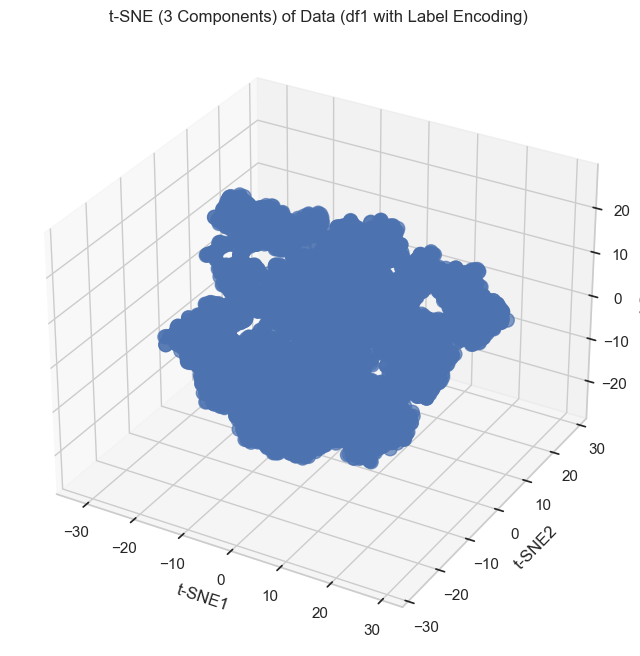

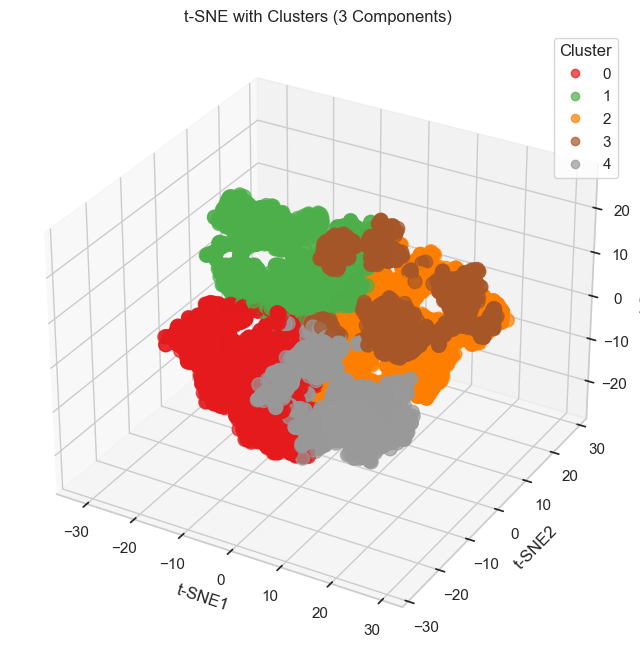

In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting

# Set visualization style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Assume df1 is your label‑encoded DataFrame
print("Dimensions of df1:", df1.shape)

# Select numeric columns from df1
numerical_cols = df1.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in df1:", numerical_cols)

# Identify binary (0/1) and continuous variables among numeric columns
binary_cols = []
continuous_cols = []
for col in numerical_cols:
    unique_values = df1[col].dropna().unique()
    # Check if the sorted unique values exactly equal [0, 1]
    if sorted(unique_values) == [0, 1]:
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

# Exclude 'patient_id' from continuous variables if it exists
if 'patient_id' in continuous_cols:
    continuous_cols.remove('patient_id')
    print("\n'patient_id' excluded from continuous variables.")

print("\nContinuous variables selected for t-SNE:", continuous_cols)
print("Binary variables detected:", binary_cols)

# Select only continuous variables from df1
df_continuous = df1[continuous_cols]

# Handle missing values by dropping rows with NA (or use imputation if preferred)
df_cleaned = df_continuous.dropna()
print(f"\nNumber of rows after dropping missing values: {df_cleaned.shape[0]}")

# Standardize the continuous variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cleaned)
df_scaled = pd.DataFrame(X_scaled, columns=continuous_cols)
print("\nStandardized data (first few rows):")
print(df_scaled.head())

# Apply t-SNE with 3 components
tsne = TSNE(n_components=3, perplexity=30, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_components, columns=['t-SNE1', 't-SNE2', 't-SNE3'])

# (Optional) Get all t-SNE points as a list
tsne_points = tsne_df.values.tolist()

# Visualization: 3D Scatter Plot of t-SNE components
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(tsne_df['t-SNE1'], tsne_df['t-SNE2'], tsne_df['t-SNE3'], s=100, alpha=0.7)
ax.set_title('t-SNE (3 Components) of Data (df1 with Label Encoding)')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_zlabel('t-SNE3')
plt.show()

# Apply K-Means clustering on the t-SNE results (using all three components)
num_clusters = 5  # Adjust as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(tsne_df[['t-SNE1', 't-SNE2', 't-SNE3']])
tsne_df['Cluster'] = clusters

# Visualization: 3D Scatter Plot with Cluster Labels
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(tsne_df['t-SNE1'], tsne_df['t-SNE2'], tsne_df['t-SNE3'], 
                     c=tsne_df['Cluster'], cmap='Set1', s=100, alpha=0.7)
ax.set_title('t-SNE with Clusters (3 Components)')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_zlabel('t-SNE3')
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()

Dimensiones de df1: (10806, 17)

Columnas numéricas en df1: ['Genero', 'Casado', 'Edad', 'Graduado', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Abandono', 'Dias_cliente', 'Campanna_anno']

Variables continuas seleccionadas para t-SNE: ['Edad', 'Profesion', 'Experiencia_laboral', 'Gastoscore', 'Family_Size', 'anno_nacimiento', 'Generacion', 'Ingresos_anuales_brutos', 'Provincia', 'Digital_encuesta', 'Gasto_medio_mensual_cuota', 'Dias_cliente', 'Campanna_anno']
Variables binarias detectadas: ['Genero', 'Casado', 'Graduado', 'Abandono']

Número de filas tras eliminar valores faltantes: 10806


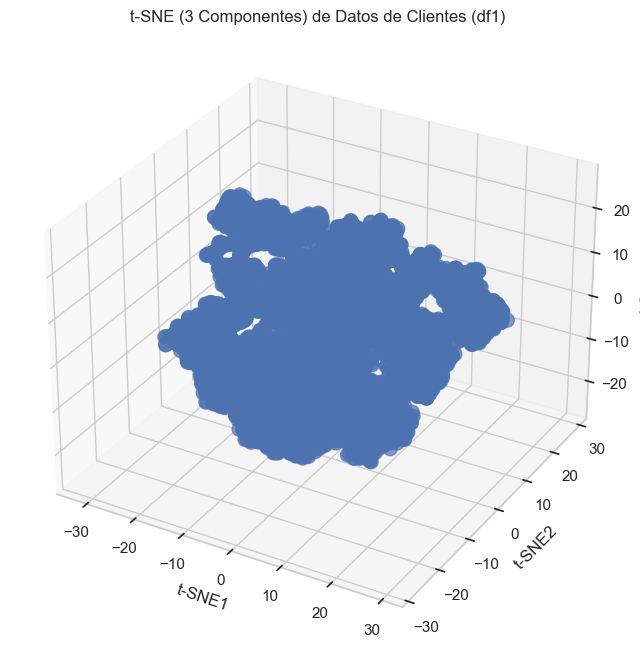

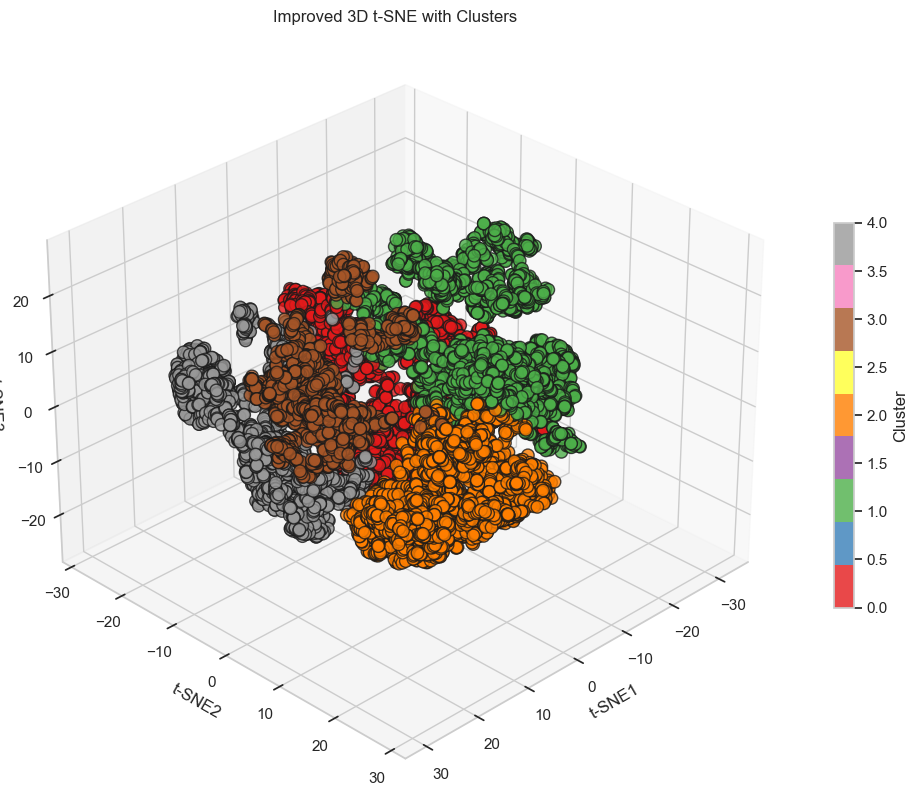

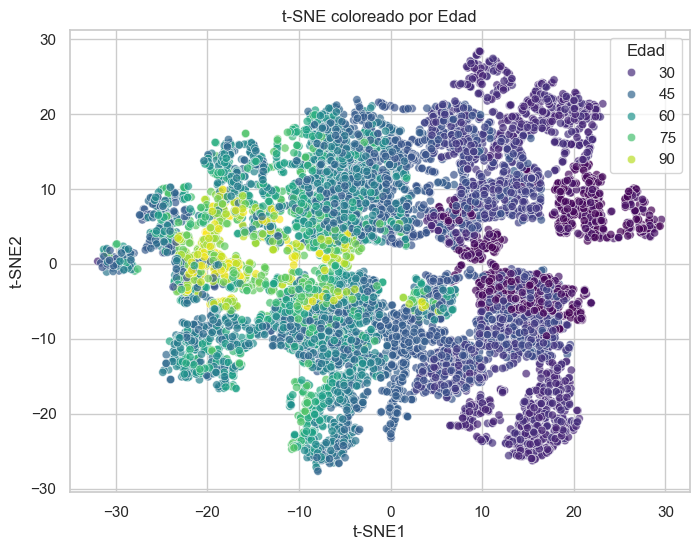

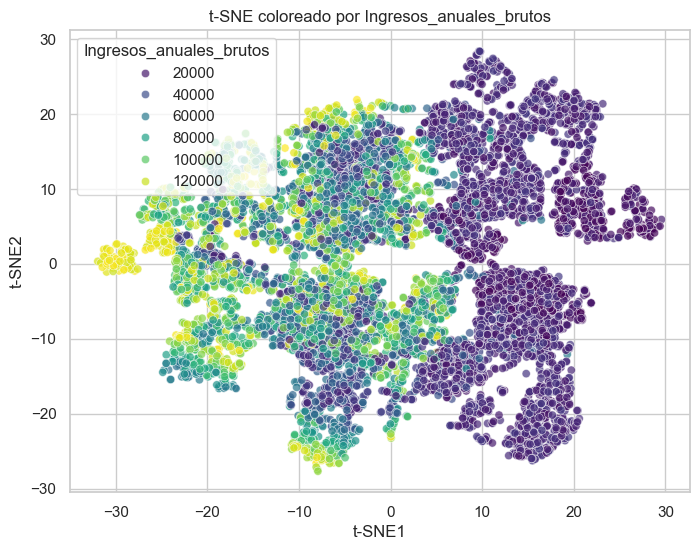

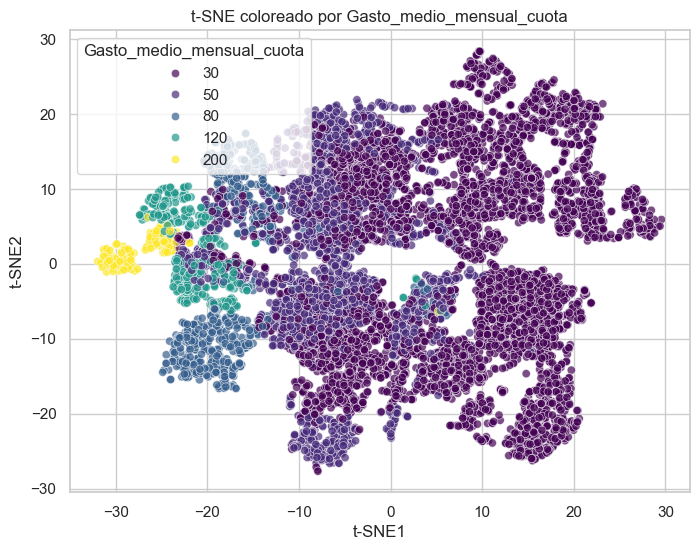

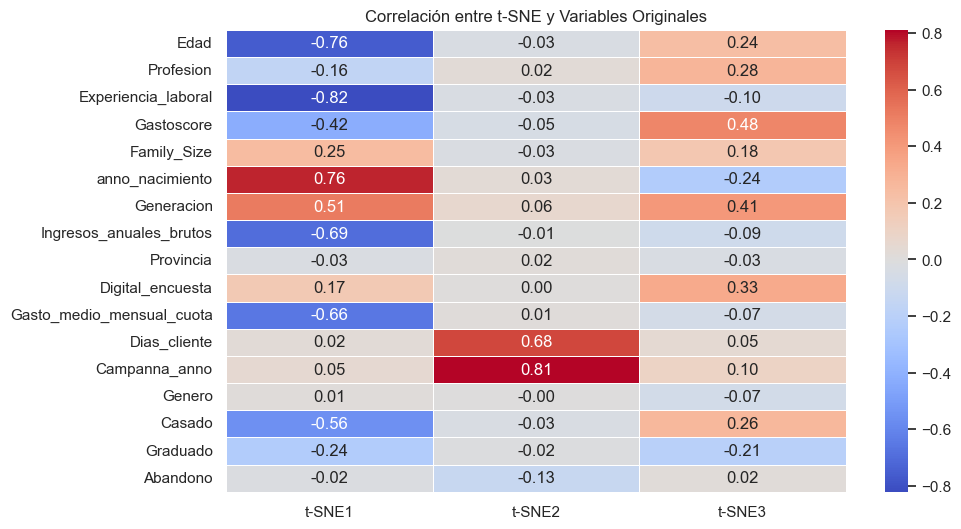

/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_68542/3402549265.py:143: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importancia_df, x='Importancia', y='Variable', palette='coolwarm', dodge=False)


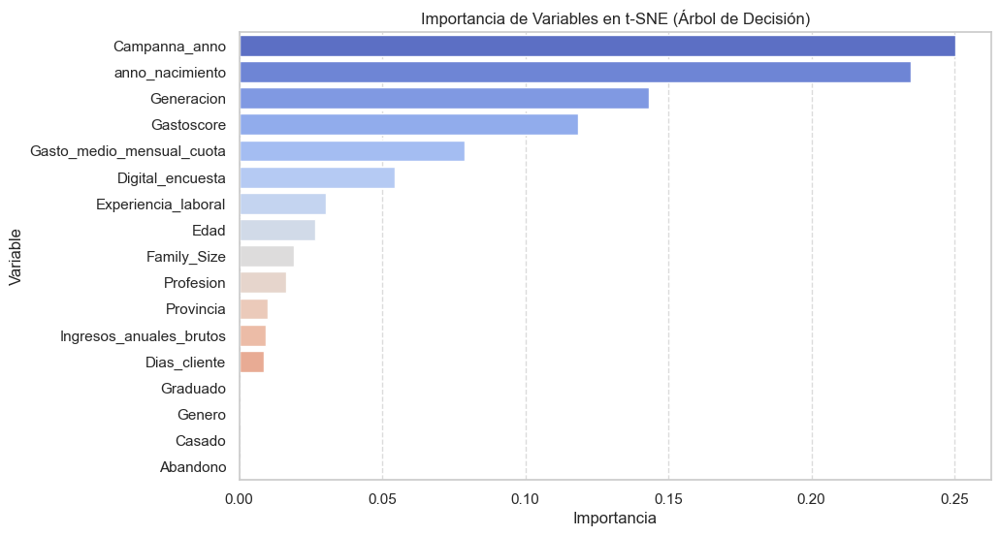

In [117]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D

# Configuración de estilos para visualización
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Asumimos que df1 es tu DataFrame de clientes ya label‑encoded
print("Dimensiones de df1:", df1.shape)

# Seleccionar columnas numéricas de df1
numerical_cols = df1.select_dtypes(include=[np.number]).columns.tolist()
print("\nColumnas numéricas en df1:", numerical_cols)

# Identificar variables binarias (0/1) y continuas
binary_cols = []
continuous_cols = []
for col in numerical_cols:
    unique_values = df1[col].dropna().unique()
    # Si los valores únicos ordenados son exactamente [0, 1], se considera binaria
    if sorted(unique_values) == [0, 1]:
        binary_cols.append(col)
    else:
        continuous_cols.append(col)

# Excluir identificadores si es necesario (por ejemplo, 'ID' o 'patient_id')
for id_col in ['ID', 'patient_id']:
    if id_col in continuous_cols:
        continuous_cols.remove(id_col)
        print(f"\n'{id_col}' excluida de las variables continuas.")

print("\nVariables continuas seleccionadas para t-SNE:", continuous_cols)
print("Variables binarias detectadas:", binary_cols)

# Seleccionar solo las variables continuas de df1
df_continuous = df1[continuous_cols]

# Manejo de valores faltantes: eliminamos filas con NA
df_cleaned = df_continuous.dropna()
print(f"\nNúmero de filas tras eliminar valores faltantes: {df_cleaned.shape[0]}")

# Estandarizar las variables continuas
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cleaned)

# Aplicar t-SNE con 3 componentes
tsne = TSNE(n_components=3, perplexity=30, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_components, columns=['t-SNE1', 't-SNE2', 't-SNE3'])

# Visualización: Gráfico 3D de t-SNE
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(tsne_df['t-SNE1'], tsne_df['t-SNE2'], tsne_df['t-SNE3'], s=100, alpha=0.7)
ax.set_title('t-SNE (3 Componentes) de Datos de Clientes (df1)')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_zlabel('t-SNE3')
plt.show()

# Clustering con K-Means sobre los 3 componentes de t-SNE
num_clusters = 5  # Ajusta según convenga
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(tsne_df[['t-SNE1', 't-SNE2', 't-SNE3']])
tsne_df['Cluster'] = clusters
# Improved 3D Scatter Plot for t-SNE with clusters
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Adjust the viewing angle: elev for elevation, azim for azimuth
ax.view_init(elev=30, azim=45)

# Use a colormap for clusters and add marker edge color for clarity
scatter = ax.scatter(
    tsne_df['t-SNE1'], tsne_df['t-SNE2'], tsne_df['t-SNE3'], 
    c=tsne_df['Cluster'], cmap='Set1', 
    s=80, alpha=0.8, edgecolor='k'
)

ax.set_title('Improved 3D t-SNE with Clusters')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_zlabel('t-SNE3')

# Optionally add a color bar to indicate clusters
cbar = plt.colorbar(scatter, ax=ax, shrink=0.5)
cbar.set_label('Cluster')

plt.show()

# ======= 1. Visualización por Variable ======= #
# Aquí seleccionamos algunas variables clave de tus datos de clientes.
# Asegúrate de usar nombres que existan en df1. Por ejemplo: 'Edad', 'Ingresos_anuales_brutos', 'Gasto_medio_mensual_cuota'
variables_a_visualizar = ['Edad', 'Ingresos_anuales_brutos', 'Gasto_medio_mensual_cuota']

for var in variables_a_visualizar:
    if var in df1.columns:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=tsne_df['t-SNE1'], y=tsne_df['t-SNE2'],
                        hue=df1[var], palette='viridis', alpha=0.7)
        plt.title(f't-SNE coloreado por {var}')
        plt.xlabel('t-SNE1')
        plt.ylabel('t-SNE2')
        plt.grid(True)
        plt.show()
    else:
        print(f"La columna {var} no se encuentra en df1.")

# ======= 2. Correlación entre t-SNE y Variables Originales ======= #
# Concatenamos tsne_df con las variables originales (continuas y binarias) de df1
df_tsne_corr = pd.concat([tsne_df, df1[continuous_cols + binary_cols]], axis=1)

# Calcular la matriz de correlación para las variables originales con las 3 componentes t-SNE
correlaciones = df_tsne_corr.corr().loc[continuous_cols + binary_cols, ['t-SNE1', 't-SNE2', 't-SNE3']]

plt.figure(figsize=(10, 6))
sns.heatmap(correlaciones, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlación entre t-SNE y Variables Originales')
plt.show()

# ======= 3. Feature Importance con Árbol de Decisión ======= #
# Utilizamos todas las variables originales de df1 para predecir cada componente t-SNE
X = df1[continuous_cols + binary_cols]
y_tsne1, y_tsne2, y_tsne3 = tsne_df['t-SNE1'], tsne_df['t-SNE2'], tsne_df['t-SNE3']

model1 = DecisionTreeRegressor(random_state=42).fit(X, y_tsne1)
model2 = DecisionTreeRegressor(random_state=42).fit(X, y_tsne2)
model3 = DecisionTreeRegressor(random_state=42).fit(X, y_tsne3)

# Promediamos la importancia de las variables obtenida de los tres modelos
feature_importance = (model1.feature_importances_ + model2.feature_importances_ + model3.feature_importances_) / 3
importancia_df = pd.DataFrame({'Variable': X.columns, 'Importancia': feature_importance})
importancia_df = importancia_df.sort_values(by='Importancia', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=importancia_df, x='Importancia', y='Variable', palette='coolwarm', dodge=False)
plt.title('Importancia de Variables en t-SNE (Árbol de Decisión)')
plt.xlabel('Importancia')
plt.ylabel('Variable')
plt.grid(True, axis='x', linestyle='--', alpha=0.7)
plt.show()

Dimensiones de df1: (10806, 17)


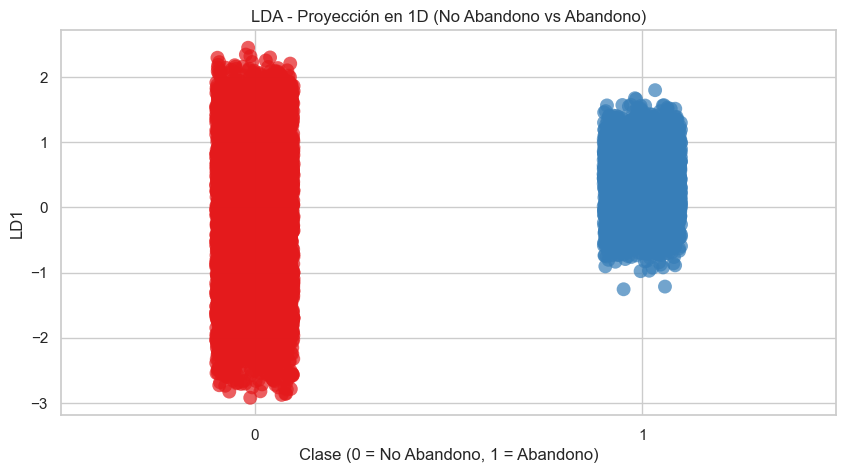


Cargas de las variables en LD1:
                                LD1
Campanna_anno              0.220963
Gastoscore                 0.042864
Digital_encuesta           0.028819
Ingresos_anuales_brutos    0.025733
Casado                     0.021556
Profesion                  0.019331
Genero                     0.011693
Graduado                  -0.020318
Family_Size               -0.023377
Provincia                 -0.027932
Generacion                -0.028606
Gasto_medio_mensual_cuota -0.029283
Experiencia_laboral       -0.032877
Edad                      -0.182125
anno_nacimiento           -0.209680
Dias_cliente              -0.632232


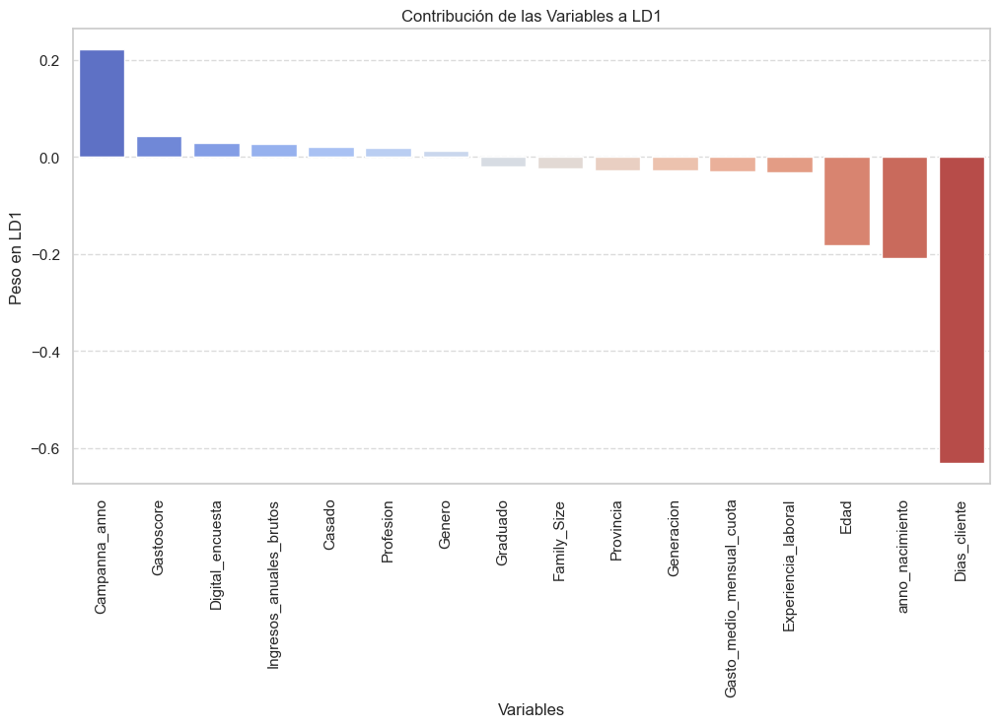


🔹 Varianza explicada por LD1: 100.00%

Autovectores de LDA:
                           Autovector_LD1
Genero                           0.023300
Casado                           0.042953
Edad                            -0.362915
Graduado                        -0.040487
Profesion                        0.038519
Experiencia_laboral             -0.065513
Gastoscore                       0.085413
Family_Size                     -0.046582
anno_nacimiento                 -0.417823
Generacion                      -0.057003
Ingresos_anuales_brutos          0.051278
Provincia                       -0.055660
Digital_encuesta                 0.057428
Gasto_medio_mensual_cuota       -0.058352
Dias_cliente                    -1.259832
Campanna_anno                    0.440307


/var/folders/kg/jyh2bj6x1g9bg2wvqbvdtt100000gn/T/ipykernel_68542/1547420330.py:100: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=autovectores_df.index, y=autovectores_df['Autovector_LD1'], palette='viridis')


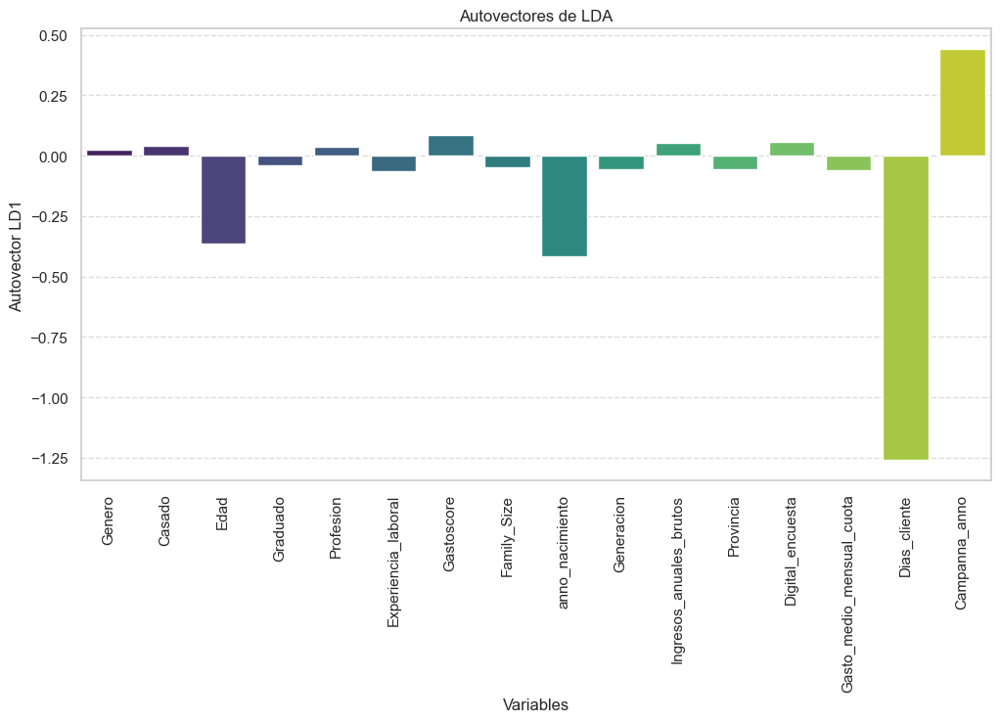

In [118]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

# Configuración de estilos
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 5)

# Asumimos que df1 es tu DataFrame de clientes y que "Abandono" es la variable target
target_column = 'Abandono'
print("Dimensiones de df1:", df1.shape)

# Verificar que el target es binario (0 y 1) y convertir si fuese necesario
if df1[target_column].dtype == 'object' or df1[target_column].dtype.name == 'category':
    print("⚠️ Convirtiendo target a binario (0 = No Abandono, 1 = Abandono)...")
    # Ajusta el mapeo según tus datos reales
    df1[target_column] = df1[target_column].map({'no': 0, 'si': 1})
    
assert set(df1[target_column].dropna().unique()) == {0, 1}, "❌ El target debe ser solo 0 y 1."

# Separar variables predictoras (X) y la variable objetivo (y)
X = df1.drop(columns=[target_column])
y = df1[target_column]

# Convertir variables categóricas a numéricas con OneHotEncoder
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()

if categorical_cols:
    print(f"⚠️ Convirtiendo variables categóricas a numéricas: {categorical_cols}")
    encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    X_encoded = encoder.fit_transform(X[categorical_cols])
    
    # Crear DataFrame con las columnas codificadas
    X_encoded_df = pd.DataFrame(X_encoded, 
                                columns=encoder.get_feature_names_out(categorical_cols),
                                index=X.index)
    
    # Eliminar las columnas categóricas originales y agregar las codificadas
    X = X.drop(columns=categorical_cols)
    X = pd.concat([X, X_encoded_df], axis=1)

# Verificar si quedan valores no numéricos
assert X.select_dtypes(exclude=[np.number]).empty, "❌ Aún quedan valores no numéricos en X."

# Normalizar las variables predictoras
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicar LDA (para target binario, se usa 1 componente)
lda = LinearDiscriminantAnalysis(n_components=1)
lda_components = lda.fit_transform(X_scaled, y)

# Crear DataFrame con la proyección LDA
lda_df = pd.DataFrame(data=lda_components, columns=['LD1'])
lda_df['Clase'] = y  # Agregamos el target para visualizar

# Visualización en 1D: Strip Plot
plt.figure(figsize=(10, 5))
sns.stripplot(x='Clase', y='LD1', data=lda_df, hue='Clase', palette='Set1', 
              jitter=True, size=10, alpha=0.7, legend=False)
plt.title('LDA - Proyección en 1D (No Abandono vs Abandono)')
plt.xlabel('Clase (0 = No Abandono, 1 = Abandono)')
plt.ylabel('LD1')
plt.grid(True)
plt.show()

# 2. Coeficientes de LDA (Cargas de las variables)
coeficientes = pd.DataFrame(lda.coef_.T, index=X.columns, columns=['LD1'])
coeficientes = coeficientes.sort_values(by='LD1', ascending=False)
print("\nCargas de las variables en LD1:")
print(coeficientes)

# 3. Gráfico de las contribuciones de las variables
plt.figure(figsize=(12, 6))
sns.barplot(x=coeficientes.index, y=coeficientes['LD1'], 
            hue=coeficientes.index, palette='coolwarm', legend=False)
plt.xticks(rotation=90)
plt.xlabel('Variables')
plt.ylabel('Peso en LD1')
plt.title('Contribución de las Variables a LD1')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

# 4. Varianza explicada (Información retenida en LD1)
varianza_explicada = lda.explained_variance_ratio_
print(f"\n🔹 Varianza explicada por LD1: {varianza_explicada[0] * 100:.2f}%")

# 5. Obtención de los Autovectores (Eigenvectors)
autovectores = lda.scalings_
autovectores_df = pd.DataFrame(autovectores, index=X.columns, columns=['Autovector_LD1'])
print("\nAutovectores de LDA:")
print(autovectores_df)

# 6. Gráfico de los Autovectores
plt.figure(figsize=(12, 6))
sns.barplot(x=autovectores_df.index, y=autovectores_df['Autovector_LD1'], palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Variables')
plt.ylabel('Autovector LD1')
plt.title('Autovectores de LDA')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

Variables seleccionadas para clustering (abs(LD1) >= 0.10):
['Campanna_anno', 'Edad', 'anno_nacimiento', 'Dias_cliente']

Dimensiones del nuevo conjunto reducido: (10806, 4)


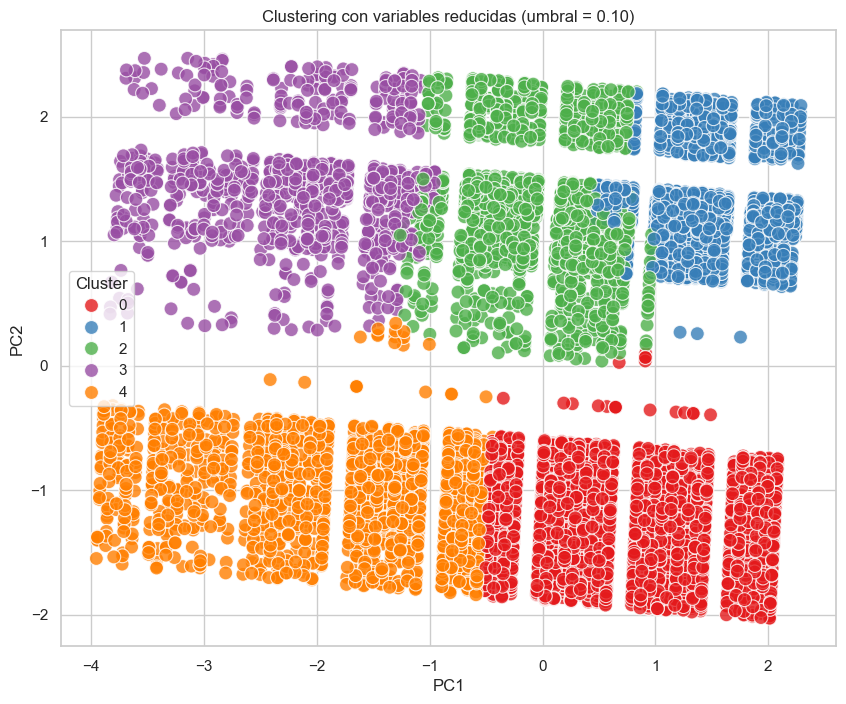


Resumen de características por Cluster:
        Campanna_anno                         Edad                     \
                 mean       std min max       mean        std min max   
Cluster                                                                 
0            0.001326  0.036394   0   1  37.033678   9.257168  20  53   
1            3.981211  0.884247   0   5  30.679019   6.010591  20  45   
2            3.235734  1.362852   0   5  49.148269   6.660424  36  67   
3            3.619094  1.337946   0   5  76.760849  10.116822  62  98   
4            0.006173  0.078345   0   1  69.296811  12.574876  53  98   

        anno_nacimiento                        Dias_cliente                  \
                   mean        std   min   max         mean        std  min   
Cluster                                                                       
0           1986.942190   9.264853  1962  2004   178.120658  74.253773   30   
1           1993.332463   6.004229  1981  2004   419.99686

In [119]:
# 1. Definir el umbral de selección
umbral = 0.1
# coeficientes es el DataFrame de cargas obtenido en el análisis LDA
selected_vars = coeficientes[coeficientes['LD1'].abs() >= umbral].index.tolist()
print("Variables seleccionadas para clustering (abs(LD1) >= {:.2f}):".format(umbral))
print(selected_vars)

# 2. Crear el DataFrame reducido con las variables seleccionadas
# Usamos df1 (tu DataFrame de clientes ya preprocesado) y eliminamos NA si es necesario.
df_reducido = df1[selected_vars].dropna()
print("\nDimensiones del nuevo conjunto reducido:", df_reducido.shape)

# 3. Estandarizar el nuevo conjunto de variables
scaler_reducido = StandardScaler()
X_reducido_scaled = scaler_reducido.fit_transform(df_reducido)

# 4. Aplicar K-Means al conjunto reducido
num_clusters = 5  # Puedes ajustar el número de clusters
kmeans_reducido = KMeans(n_clusters=num_clusters, random_state=42)
clusters_reducido = kmeans_reducido.fit_predict(X_reducido_scaled)
df_reducido['Cluster'] = clusters_reducido

# (Opcional) Visualizar en 2D usando PCA sobre las variables reducidas
from sklearn.decomposition import PCA
pca_reducido = PCA(n_components=2)
X_reducido_pca = pca_reducido.fit_transform(X_reducido_scaled)
pca_reducido_df = pd.DataFrame(X_reducido_pca, columns=['PC1', 'PC2'], index=df_reducido.index)
pca_reducido_df['Cluster'] = clusters_reducido

plt.figure(figsize=(10,8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_reducido_df,
                palette='Set1', s=100, alpha=0.8)
plt.title("Clustering con variables reducidas (umbral = {:.2f})".format(umbral))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()

# 5. Obtener características de cada grupo
# Por ejemplo, calcular estadísticas descriptivas para cada cluster
cluster_summary = df_reducido.groupby('Cluster').agg(['mean','std','min','max'])
print("\nResumen de características por Cluster:")
print(cluster_summary)